In [6]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

In [7]:
NOISE_DIM = 100  
BATCH_SIZE = 4 
STEPS_PER_EPOCH = 3750
EPOCHS = 10
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [8]:
MAIN_DIR = "../input/brain-mri-images-for-brain-tumor-detection/yes"

# Loading and Preprocessing the Images

In [9]:
def load_images(folder):
    
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue
        
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

In [10]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

## Generate 20 random numbers to index images from data

In [11]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 20)

In [12]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

## Normalize and Reshape the Data

In [13]:
# Normalize the Images
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

# Reshape images 
X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

# Check shape
X_train.shape

(20, 128, 128, 1)

## Plotting The Real Images

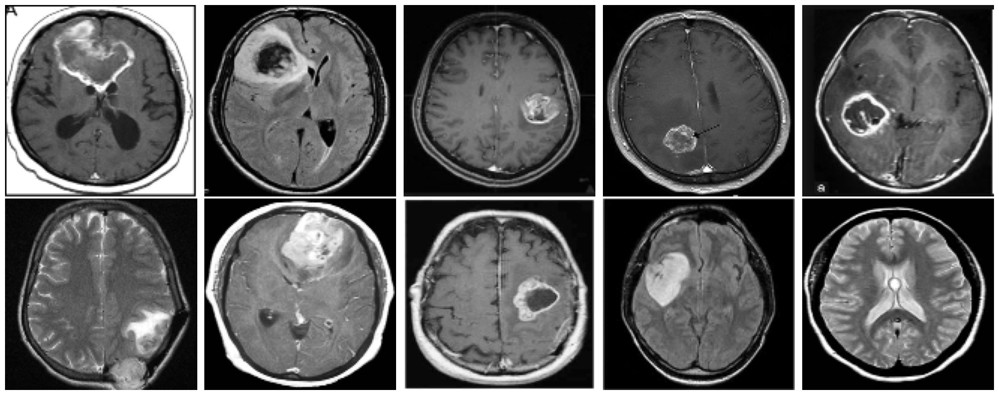

In [14]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

# The Architecture

In [15]:
def build_generator():

    """
        Generator model "generates" images using random noise. The random noise AKA Latent Vector
        is sampled from a Normal Distribution which is given as the input to the Generator. Using
        Transposed Convolution, the latent vector is transformed to produce an image
        We use 3 Conv2DTranspose layers (which help in producing an image using features; opposite
        of Convolutional Learning)

        Input: Random Noise / Latent Vector
        Output: Image
    """

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model

In [16]:
def build_discriminator():
    
    """
        Discriminator is the model which is responsible for classifying the generated images
        as fake or real. Our end goal is to create a Generator so powerful that the Discriminator
        is unable to classify real and fake images
        A simple Convolutional Neural Network with 2 Conv2D layers connected to a Dense output layer
        Output layer activation is Sigmoid since this is a Binary Classifier

        Input: Generated / Real Image
        Output: Validity of Image (Fake or Real)

    """

    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

# Putting it together

In [17]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │          65,537 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 582,785 (2.22 MB)

 Trainable params: 582,785 (2.22 MB)

 Non-trainable params: 0 (0.00 B)

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 262144)              │      26,476,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 262144)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 64, 64, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 128, 128, 128)       │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 128, 128, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 128, 128, 1)         │           2,049 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,265,281 (104.01 MB)

 Trainable params: 27,265,281 (104.01 MB)

 Non-trainable params: 0 (0.00 B)

The Combined Network:



Model: "gan_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ generator (Sequential)               │ (None, 128, 128, 1)         │      27,265,281 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ discriminator (Sequential)           │ (None, 1)                   │         582,785 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,848,066 (106.23 MB)

 Trainable params: 27,265,281 (104.01 MB)

 Non-trainable params: 582,785 (2.22 MB)

In [18]:
def sample_images(noise, figsize=(24, 20), save=False):
    """
    Display generated images in a grid layout that automatically adjusts to the number of images
    """
    generated_images = generator.predict(noise)
    n_images = len(generated_images)
    
    # Calculate optimal grid size
    grid_size = math.ceil(math.sqrt(n_images))
    n_rows = grid_size
    n_cols = grid_size
    
    # Create figure with adjusted size
    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        if i >= n_images:  # Stop if we've displayed all images
            break
            
        plt.subplot(n_rows, n_cols, i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')
        else:
            # Rescale image to 0-1 if needed
            img = (image + 1) * 0.5 if image.min() < 0 else image
            plt.imshow(img)
        plt.axis('off')
    
    plt.tight_layout()
    
    if save:
        plt.savefig('generated_images.png')
    plt.show()

## The Training

In [19]:
# # Create output directory
# output_dir = '/kaggle/working/gan_outputs'
# os.makedirs(output_dir, exist_ok=True)

# np.random.seed(SEED)
# for epoch in range(10):
#     for batch in tqdm(range(STEPS_PER_EPOCH)):
#         noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
#         fake_X = generator.predict(noise)
        
#         idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
#         real_X = X_train[idx]
#         X = np.concatenate((real_X, fake_X))
#         disc_y = np.zeros(2*BATCH_SIZE)
#         disc_y[:BATCH_SIZE] = 1
#         d_loss = discriminator.train_on_batch(X, disc_y)
        
#         y_gen = np.ones(BATCH_SIZE)
#         g_loss = gan.train_on_batch(noise, y_gen)
#     print(f"EPOCH: {epoch + 1} Generator Loss: {g_loss:.4f} Discriminator Loss: {d_loss:.4f}")
    
#     # Generate and save sample images for each epoch
#     noise = np.random.normal(0, 1, size=(10,NOISE_DIM))
#     generated_images = generator.predict(noise)
#     plt.figure(figsize=(10, 4))
    
#     for i in range(generated_images.shape[0]):
#         plt.subplot(2, 5, i+1)
#         img = generated_images[i]
#         # Rescale image to 0-1 if necessary
#         img = (img + 1) * 0.5 if img.min() < 0 else img
#         plt.imshow(img)
#         plt.axis('off')
    
#     plt.tight_layout()
#     plt.savefig(os.path.join(output_dir, f'samples_epoch_{epoch+1}.png'))
#     plt.close()

# # Save final models after all epochs are complete
# generator.save(os.path.join(output_dir, 'generator_final.h5'))
# discriminator.save(os.path.join(output_dir, 'discriminator_final.h5'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


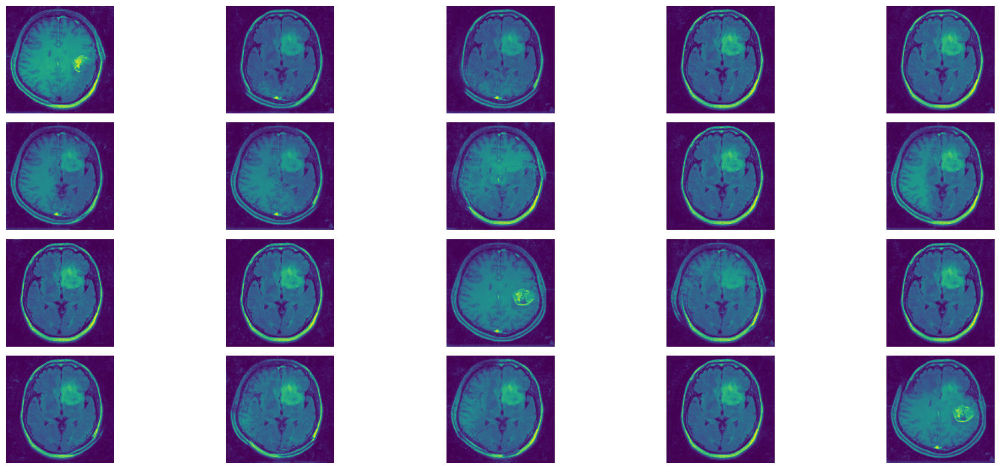

In [20]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Custom objects to handle version compatibility
custom_objects = {
    'Conv2DTranspose': lambda **kwargs: tf.keras.layers.Conv2DTranspose(
        **{k: v for k, v in kwargs.items() if k != 'groups'}
    )
}

# Load the saved generator model
generator = tf.keras.models.load_model(
    '/kaggle/input/generator_final.h5/tensorflow2/default/1/generator_final.h5',
    custom_objects=custom_objects,
    compile=False
)

# Function to generate and display images
def generate_images(n_images=20, noise_dim=100):
    # Generate noise for input
    noise = np.random.normal(0, 1, size=(n_images, noise_dim))
    
    # Generate images
    generated_images = generator.predict(noise)
    
    # Plot images
    plt.figure(figsize=(20, 8))
    for i in range(n_images):
        plt.subplot(4, 5, i+1)
        img = generated_images[i]
        img = (img + 1) * 0.5 if img.min() < 0 else img  # Rescale if needed
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Generate some images
generate_images()

# If you need to specify a different noise dimension:
# generate_images(noise_dim=128)  # if you used 128-dimensional noise
# generate_images(n_images=5)     # if you want to generate 5 images instead of 10

# Let's generate some images !

8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step


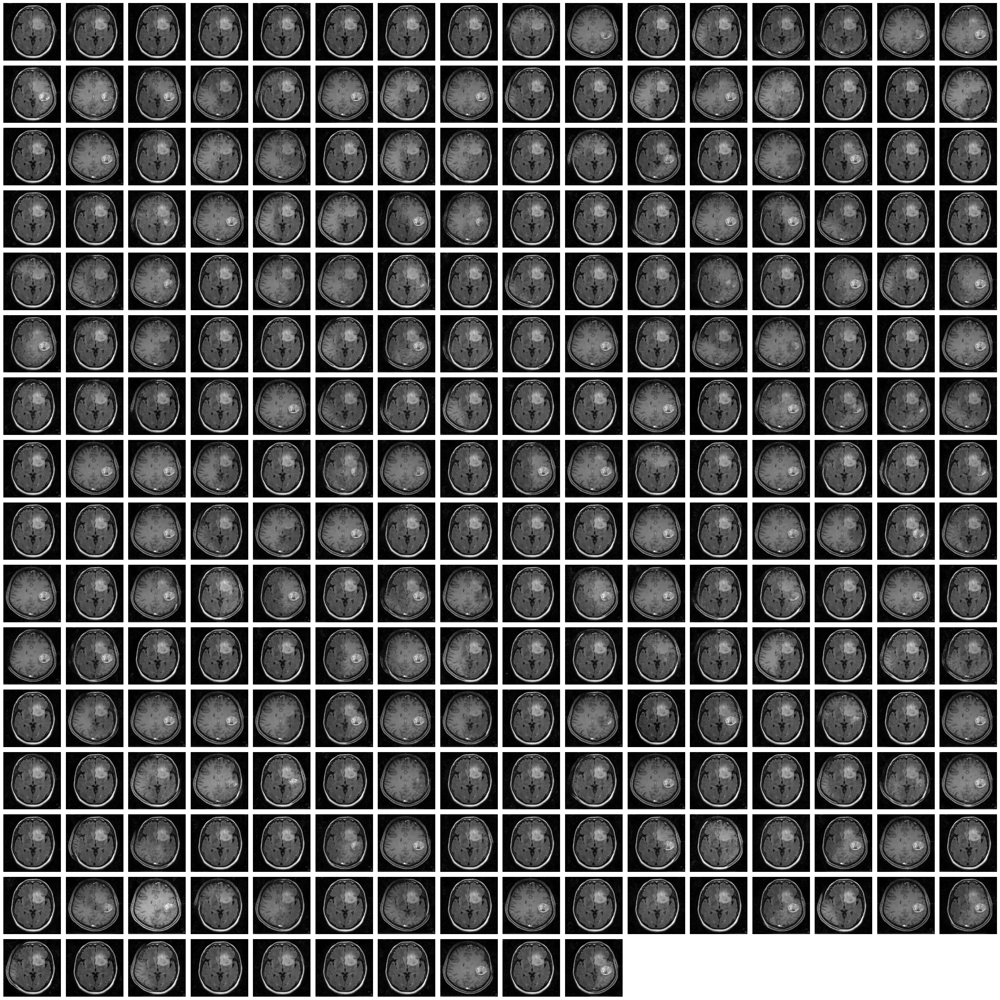

In [21]:
import math
noise = np.random.normal(0, 1, size=(250, NOISE_DIM))
sample_images(noise, figsize=(30, 30), save=True)

# Testing the Generated sample: Plotting the Distributions

<p style="font-size:20px">In this test, we compare the generated images with the real samples by plotting their distributions. If the distributions overlap, that indicates the generated samples are very close to the real ones
</p>

In [22]:
generated_images = generator.predict(noise)
generated_images.shape

8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step


(250, 128, 128, 1)

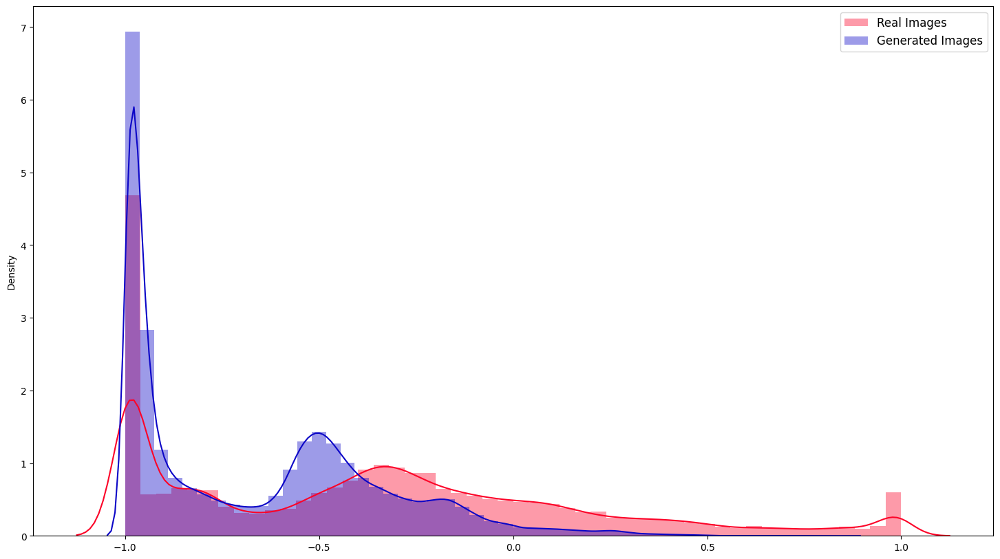

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Create the distribution plot
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))
sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)
axs.legend(loc='upper right', prop={'size': 12})

# Save the plot
# Make sure the plots directory exists
if not os.path.exists('plots'):
    os.makedirs('plots')

# Save with high DPI for better quality
plt.savefig('plots/distribution_comparison.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

In [24]:
# Function to calculate discriminator accuracy
def calculate_accuracy(discriminator, real_images, fake_images):
    """
    Calculates accuracy of the discriminator in distinguishing real vs fake images.
    """
    # Predictions for real images (should be close to 1)
    real_preds = discriminator.predict(real_images)
    real_acc = np.mean(real_preds >= 0.5)  # Correct if prediction >= 0.5
    
    # Predictions for fake images (should be close to 0)
    fake_preds = discriminator.predict(fake_images)
    fake_acc = np.mean(fake_preds < 0.5)  # Correct if prediction < 0.5
    
    # Overall accuracy
    overall_acc = (real_acc + fake_acc) / 2
    return real_acc, fake_acc, overall_acc

# Calculate accuracy after training (example usage)
real_images = X_train[:BATCH_SIZE]  # Use a batch of real images
noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM))  # Generate random noise
fake_images = generator.predict(noise)  # Generate fake images

real_acc, fake_acc, overall_acc = calculate_accuracy(discriminator, real_images, fake_images)

print(f"Discriminator Accuracy on Real Images: {real_acc * 100:.2f}%")
print(f"Discriminator Accuracy on Fake Images: {fake_acc * 100:.2f}%")
print(f"Overall Discriminator Accuracy: {overall_acc * 100:.2f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Discriminator Accuracy on Real Images: 100.00%
Discriminator Accuracy on Fake Images: 25.00%
Overall Discriminator Accuracy: 62.50%


In [25]:
from sklearn.metrics import accuracy_score

# Function to calculate discriminator accuracy score
def calculate_accuracy_score(discriminator, real_images, fake_images):
    """
    Calculates the accuracy score of the discriminator using true labels.
    """
    # Predictions for real and fake images
    real_preds = discriminator.predict(real_images)
    fake_preds = discriminator.predict(fake_images)
    
    # Binary predictions: 1 for real (>= 0.5), 0 for fake (< 0.5)
    real_preds_binary = (real_preds >= 0.5).astype(int)
    fake_preds_binary = (fake_preds < 0.5).astype(int)
    
    # Ground truth labels: 1 for real, 0 for fake
    real_labels = np.ones(real_preds_binary.shape[0])
    fake_labels = np.zeros(fake_preds_binary.shape[0])
    
    # Combine predictions and labels
    all_preds = np.concatenate([real_preds_binary, fake_preds_binary])
    all_labels = np.concatenate([real_labels, fake_labels])
    
    # Calculate accuracy score
    accuracy = accuracy_score(all_labels, all_preds)
    return accuracy

# Example usage
real_images = X_train[:BATCH_SIZE]  # Use a batch of real images
noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM))  # Generate random noise
fake_images = generator.predict(noise)  # Generate fake images

# Calculate and print accuracy score
accuracy = calculate_accuracy_score(discriminator, real_images, fake_images)
print(f"Discriminator Accuracy Score: {accuracy * 100:.2f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Discriminator Accuracy Score: 87.50%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Discriminator Accuracy on Real Images: 100.00%
Discriminator Accuracy on Fake Images: 75.00%
Overall Discriminator Accuracy: 87.50%


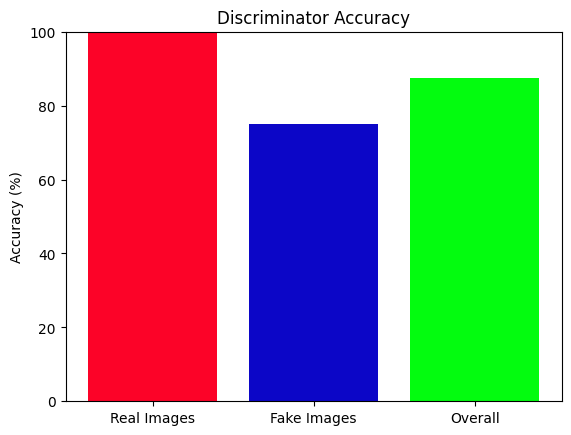

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate discriminator accuracy
def calculate_accuracy(discriminator, real_images, fake_images):
    """
    Calculates the accuracy of the discriminator in distinguishing real vs fake images.
    """
    # Predictions for real images
    real_preds = discriminator.predict(real_images)
    real_acc = np.mean(real_preds >= 0.5)  # Correct if prediction >= 0.5

    # Predictions for fake images
    fake_preds = discriminator.predict(fake_images)
    fake_acc = np.mean(fake_preds < 0.5)  # Correct if prediction < 0.5

    # Overall accuracy
    overall_acc = (real_acc + fake_acc) / 2
    return real_acc, fake_acc, overall_acc

# Generate some real and fake images
real_images = X_train[:BATCH_SIZE]  # Use a batch of real images
noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM))  # Generate random noise
fake_images = generator.predict(noise)  # Generate fake images

# Calculate accuracy
real_acc, fake_acc, overall_acc = calculate_accuracy(discriminator, real_images, fake_images)

# Print results
print(f"Discriminator Accuracy on Real Images: {real_acc * 100:.2f}%")
print(f"Discriminator Accuracy on Fake Images: {fake_acc * 100:.2f}%")
print(f"Overall Discriminator Accuracy: {overall_acc * 100:.2f}%")

# Plot the accuracies
accuracy_labels = ["Real Images", "Fake Images", "Overall"]
accuracies = [real_acc * 100, fake_acc * 100, overall_acc * 100]

plt.bar(accuracy_labels, accuracies, color=['#fc0328', '#0c06c7', '#03fc0f'])
plt.ylim(0, 100)
plt.title("Discriminator Accuracy")
plt.ylabel("Accuracy (%)")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


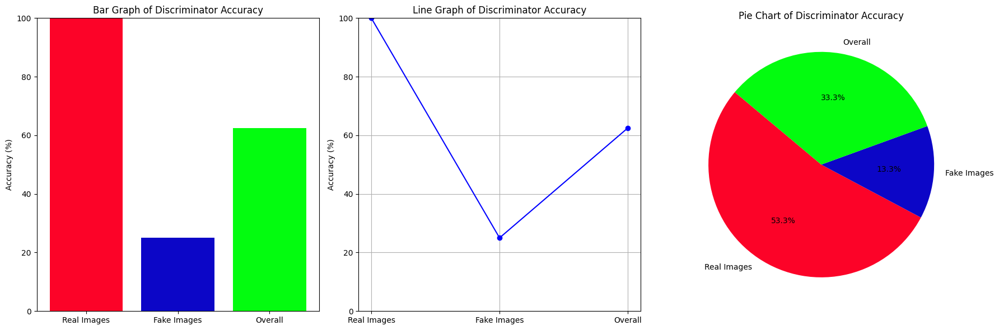

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate discriminator accuracy
def calculate_accuracy(discriminator, real_images, fake_images):
    """
    Calculates the accuracy of the discriminator in distinguishing real vs fake images.
    """
    # Predictions for real images
    real_preds = discriminator.predict(real_images)
    real_acc = np.mean(real_preds >= 0.5)  # Correct if prediction >= 0.5

    # Predictions for fake images
    fake_preds = discriminator.predict(fake_images)
    fake_acc = np.mean(fake_preds < 0.5)  # Correct if prediction < 0.5

    # Overall accuracy
    overall_acc = (real_acc + fake_acc) / 2
    return real_acc, fake_acc, overall_acc

# Generate some real and fake images
real_images = X_train[:BATCH_SIZE]  # Use a batch of real images
noise = np.random.normal(0, 1, size=(BATCH_SIZE, NOISE_DIM))  # Generate random noise
fake_images = generator.predict(noise)  # Generate fake images

# Calculate accuracy
real_acc, fake_acc, overall_acc = calculate_accuracy(discriminator, real_images, fake_images)

# Prepare data for visualization
accuracy_labels = ["Real Images", "Fake Images", "Overall"]
accuracies = [real_acc * 100, fake_acc * 100, overall_acc * 100]

# Plot 1: Bar Graph
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.bar(accuracy_labels, accuracies, color=['#fc0328', '#0c06c7', '#03fc0f'])
plt.ylim(0, 100)
plt.title("Bar Graph of Discriminator Accuracy")
plt.ylabel("Accuracy (%)")

# Plot 2: Line Graph
plt.subplot(1, 3, 2)
plt.plot(accuracy_labels, accuracies, marker='o', linestyle='-', color='b')
plt.ylim(0, 100)
plt.title("Line Graph of Discriminator Accuracy")
plt.ylabel("Accuracy (%)")
plt.grid(True)

# Plot 3: Pie Chart
plt.subplot(1, 3, 3)
plt.pie(accuracies, labels=accuracy_labels, autopct='%1.1f%%', startangle=140, colors=['#fc0328', '#0c06c7', '#03fc0f'])
plt.title("Pie Chart of Discriminator Accuracy")

# Show the graphs
plt.tight_layout()
plt.show()

In [28]:
!pip install gradio


In [33]:
import gradio as gr
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage import filters, restoration
from PIL import Image
import math
from concurrent.futures import ThreadPoolExecutor
import gc

def process_image_batch(batch, filter_type):
    """Process a batch of images with the specified filter"""
    processed_images = []
    for image in batch:
        img = image[:, :, 0]  # Extract single channel
        filtered = apply_filters(img, filter_type)
        processed_images.append(filtered)
    return processed_images

def save_and_display_images(n_images=4, noise_dim=100, image_size=64, filter_type="none"):
    try:
        # Create batches to process images in chunks
        batch_size = 50  # Process 50 images at a time
        n_batches = math.ceil(n_images / batch_size)
        
        all_filtered_images = []
        image_paths = []
        
        for batch_idx in range(n_batches):
            # Clear memory from previous batch
            gc.collect()
            
            start_idx = batch_idx * batch_size
            end_idx = min((batch_idx + 1) * batch_size, n_images)
            current_batch_size = end_idx - start_idx
            
            # Generate batch of images
            noise = np.random.normal(0, 1, size=(current_batch_size, noise_dim))
            images = generator.predict(noise)
            images = (images + 1) / 2.0
            
            # Process batch using multiple threads
            with ThreadPoolExecutor() as executor:
                filtered_batch = list(executor.map(
                    lambda img: apply_filters(img[:, :, 0], filter_type),
                    images
                ))
            
            # Save images from current batch
            for i, filtered_image in enumerate(filtered_batch):
                global_idx = start_idx + i
                image_path = os.path.join(output_dir, f"mri_image_{global_idx+1}.png")
                plt.imsave(image_path, filtered_image, cmap='gray')
                image_paths.append(image_path)
                all_filtered_images.append(filtered_image)
        
        # Create display grid (show first 16 images maximum)
        display_count = min(16, n_images)
        cols = min(4, display_count)
        rows = math.ceil(display_count / cols)
        
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        if rows == 1 and cols == 1:
            axes = np.array([[axes]])
        elif rows == 1 or cols == 1:
            axes = axes.reshape(rows, cols)
            
        for i in range(rows * cols):
            ax = axes[i // cols, i % cols]
            if i < display_count:
                ax.imshow(all_filtered_images[i], cmap='gray')
            ax.axis('off')
            
        plt.tight_layout()
        
        # Create GIF (using first 50 images maximum)
        gif_images = [Image.fromarray((img * 255).astype(np.uint8)) 
                     for img in all_filtered_images[:50]]
        gif_path = os.path.join(output_dir, "image_evolution.gif")
        gif_images[0].save(
            gif_path,
            save_all=True,
            append_images=gif_images[1:],
            duration=500,
            loop=0
        )
        
        # Load distribution plot if it exists
        plot_path = '/kaggle/working/plots/distribution_comparison.png'
        dist_plot = Image.open(plot_path) if os.path.exists(plot_path) else None
        
        return fig, f"Successfully generated {n_images} images", gif_path, image_paths, dist_plot
        
    except Exception as e:
        return None, f"Error: {str(e)}", None, [], None

# Create interface with memory warning
interface = gr.Interface(
    fn=save_and_display_images,
    inputs=[
        gr.Slider(1, 250, step=1, label="Number of Images", value=4),
        gr.Slider(50, 200, step=10, label="Noise Dimension", value=100),
        gr.Dropdown([64, 128, 256], label="Image Size in Px", value=64),
        gr.Dropdown(["none", "edge_enhancement", "noise_reduction"], 
                   label="Filter Type", value="none")
    ],
    outputs=[
        "plot",
        "text",
        gr.File(label="Download GIF"),
        gr.Gallery(label="Download Individual Images"),
        gr.Image(label="Distribution Comparison")
    ],
) 
with gr.Blocks(theme=gr.themes.Soft()) as interface:
    gr.Markdown(
        """
        # 🧠 BrainGAN: Advanced Neural MRI Synthesis Platform
        
        Transform your research with our state-of-the-art MRI image synthesis engine. Leveraging cutting-edge generative AI technology, 
        BrainGAN produces high-fidelity brain MRI images that push the boundaries of medical imaging simulation.
        """
    )
    
    with gr.Row():
        with gr.Column(scale=1):
            # Control Panel
            gr.Markdown("### 🎮 Control Panel")
            num_images = gr.Slider(
                1, 250, value=4, step=1, 
                label="Number of Images",
                info="Select how many images to generate"
            )
            noise_dim = gr.Slider(
                50, 200, value=100, step=10, 
                label="Noise Dimension",
                info="Adjust complexity of generated images"
            )
            image_size = gr.Dropdown(
                [64, 128, 256], value=64, 
                label="Image Size in Px",
                info="Select output resolution"
            )
            filter_type = gr.Dropdown(
                ["none", "edge_enhancement", "noise_reduction"], 
                value="none",
                label="Filter Type",
                info="Apply post-processing filters"
            )
            generate_btn = gr.Button("🔄 Generate Images", variant="primary")

        with gr.Column(scale=2):
            # Output Panel
            gr.Markdown("### 🖼️ Generated Images")
            output_plot = gr.Plot(label="Preview Grid")
            output_text = gr.Textbox(label="Status")
            
    with gr.Row():
        with gr.Column():
            # Downloads Section
            gr.Markdown("### 📥 Downloads & Analysis")
            output_gif = gr.File(label="Download Animation (GIF)")
            output_gallery = gr.Gallery(label="Individual Images", columns=4, height="auto")
            output_dist = gr.Image(label="Distribution Analysis")
    
    # Footer
    gr.Markdown(
        """
        ---
        ℹ️ **Note:** For optimal performance, large batches (>50 images) will display first 16 previews 
        with GIF animations limited to 50 frames.
        """
    )
    
    # Set up event handler
    generate_btn.click(
        fn=save_and_display_images,
        inputs=[num_images, noise_dim, image_size, filter_type],
        outputs=[output_plot, output_text, output_gif, output_gallery, output_dist]
    )

# Launch the interface
interface.launch(
    share=True,
    server_name="0.0.0.0"
)

* Running on local URL:  http://0.0.0.0:7863
* Running on public URL: https://b338ad39adf762316c.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 886ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [ ]:
!pip install gradio huggingface_hub


In [ ]:
from huggingface_hub import login
login()


In [ ]:
!gradio deploy


In [ ]:
2nd version below

In [ ]:
import gradio as gr
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage import filters, restoration
from PIL import Image

# Directory to save generated images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)

# Apply filtering to images



# Generate images
def generate_images(n_images=4, noise_dim=100):
    noise = np.random.normal(0, 1, size=(n_images, noise_dim))
    generated_images = generator.predict(noise)  # Assuming generator is a predefined model
    generated_images = (generated_images + 1) / 2.0  # Normalize to [0, 1] for display
    return generated_images

# Save, display, and allow filtering of generated images
def save_and_display_images(n_images=4, image_size=64, filter_type="none"):
    images = generate_images(n_images)
    
    # Apply filtering to images
    filtered_images = []
    for i in range(n_images):
        image = images[i, :, :, 0]  # Extracting single channel (e.g., grayscale)
        filtered_image = apply_filters(image, filter_type)
        filtered_images.append(filtered_image)
    
    filtered_images = np.array(filtered_images)
    
    # Optimized figure layout for high-quality display
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 3, 3))
    
    if n_images == 1:
        axes = [axes]
        
    for i, ax in enumerate(axes):
        ax.imshow(filtered_images[i], cmap='gray')
        ax.axis('off')
    
    plt.tight_layout()
    plt.close(fig)

    # Save images locally
    image_paths = []
    for i in range(n_images):
        image_path = os.path.join(output_dir, f"mri_image_{i+1}.png")
        plt.imsave(image_path, filtered_images[i], cmap='gray')
        image_paths.append(image_path)

    # Create a GIF animation from the images
    gif_path = os.path.join(output_dir, "image_evolution.gif")
    images_for_gif = [Image.open(img_path) for img_path in image_paths]
    images_for_gif[0].save(gif_path, save_all=True, append_images=images_for_gif[1:], duration=500, loop=0)

    return fig, f"Images saved in directory: {output_dir}", gif_path, image_paths

# Gradio Interface
interface = gr.Interface(
    fn=lambda n_images, noise_dim, image_size, filter_type: save_and_display_images(
        int(n_images), int(image_size), filter_type
    ),
    inputs=[
        gr.Slider(1, 50, step=1, label="Number of Images"),
        gr.Slider(50, 200, step=10, label="Noise Dimension"),
        gr.Dropdown([64, 128, 256], label="Image Size in Px"),
        gr.Dropdown(["none", "edge_enhancement", "noise_reduction"], label="Filter Type")
    ],
    outputs=[
        "plot", 
        "text",
        gr.File(label="Download GIF"),  # Output for GIF
        gr.Gallery(label="Download Individual Images")  # Output for individual images
    ],
    title="High-Quality MRI Image Generator",
    description="Generate and save high-quality MRI images with adjustable parameters, including optional post-processing filters."
)

interface.launch()
